# Guides to LiDAR (Part 4 - Using Laspy and Datashader)

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Installation" data-toc-modified-id="Installation-1">Installation</a></span></li><li><span><a href="#Read-the-LAS-file" data-toc-modified-id="Read-the-LAS-file-2">Read the LAS file</a></span></li><li><span><a href="#Plot-the-tile-using-datashader" data-toc-modified-id="Plot-the-tile-using-datashader-3">Plot the tile using datashader</a></span></li><li><span><a href="#Separate-the-different-classes-of-pixel" data-toc-modified-id="Separate-the-different-classes-of-pixel-4">Separate the different classes of pixel</a></span></li><li><span><a href="#Create-a-3D-surface-visualization" data-toc-modified-id="Create-a-3D-surface-visualization-5">Create a 3D surface visualization</a></span></li><li><span><a href="#References" data-toc-modified-id="References-6">References</a></span></li></ul></div>

Tyler Sloan used `DataShader`<a href="#References">[1]</a> in his presentation<a href="#References">[2]</a> to visualize LiDAR data. Also, this notebook depends on the same library, as well as `LASzip` (in downloading, or unzipping LAZ files), and `laspy`<a href="#References">[3]</a>  (in reading and writing LiDAR data). Note that, we only really need the `LASzip` tool within `LAStools`, but we've installed the entire suite.

The reason we use `DataShader` to visualize the LAS data here is due to its:
  1. `datashader` is designed to "rasterize" or "aggregate" datasets into regular grids that can be viewed as images, making it simple and quick to see the properties and patterns of your data. 
  2. `datashader` can plot a billion points in a second or so on a 16GB laptop, and scales up easily to out-of-core or distributed processing for even larger datasets.

Let's start by installing required packages - `laspy` and `datashader`:

## Installation

In [ ]:
!pip install laspy

In [ ]:
!pip install datashader

If the packages are installed successfully, importing statements in the cell below should work without any problems:

In [2]:
from laspy.file import File
import datashader as ds
import datashader.transfer_functions as tf

## Read the LAS file

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
sample_data = r'<Root Folder>\PointCloud\Data\Montreal_City\298-5041_2015_2-5-6.las'
export_path = 'export//'

The first step for getting started with `laspy` is to open a `laspy.file.File` object in read mode:

In [5]:
inFile = File(sample_data, mode='r')

LAS files differ in what data is available, and you may want to check out what the contents of your file are. `laspy` includes several methods to document the file specification, based on the laspy.util.Format objects which are used to parse the file.

In [6]:
# Find out what the point format looks like.
pointformat = inFile.point_format
for spec in inFile.point_format:
    print(spec.name)

X
Y
Z
intensity
flag_byte
raw_classification
scan_angle_rank
user_data
pt_src_id
gps_time


In [7]:
#Lets take a look at the header also.
headerformat = inFile.header.header_format
for spec in headerformat:
    print(spec.name)

file_sig
file_source_id
global_encoding
proj_id_1
proj_id_2
proj_id_3
proj_id_4
version_major
version_minor
system_id
software_id
created_day
created_year
header_size
data_offset
num_variable_len_recs
data_format_id
data_record_length
point_records_count
point_return_count
x_scale
y_scale
z_scale
x_offset
y_offset
z_offset
x_max
x_min
y_max
y_min
z_max
z_min
start_wavefm_data_rec


`laspy` can actually scale the x, y, and z dimensions for you. Upper case dimensions (`las_file.X, las_file.Y, las_file.Z`) give the raw integer dimensions, while lower case dimensions (`las_file.x, las_file.y, las_file.z`) give the scaled value. Both methods support assignment as well, although due to rounding error assignment using the scaled dimensions is not reccomended.

In [8]:
# Grab all of the points from the file.
point_records = inFile.points

# Grab just the X dimension from the file, and scale it.
def scaled_x_dimension(las_file):
    x_dimension = las_file.X
    scale = las_file.header.scale[0]
    offset = las_file.header.offset[0]
    return(x_dimension*scale + offset)

scaled_x = scaled_x_dimension(inFile)
scaled_x

array([298033.89, 298031.94, 298030.94, ..., 298586.03, 298586.21,
       298586.42])

`numpy` has made finding a subset of a larger data set fairly easy. Next, let's try finding out whether a file has accurate min and max values for the X, Y, and Z dimensions:

In [10]:
# Get arrays which indicate invalid X, Y, or Z values.
X_invalid = np.logical_or((inFile.header.min[0] > inFile.x),
                          (inFile.header.max[0] < inFile.x))
Y_invalid = np.logical_or((inFile.header.min[1] > inFile.y),
                          (inFile.header.max[1] < inFile.y))
Z_invalid = np.logical_or((inFile.header.min[2] > inFile.z),
                          (inFile.header.max[2] < inFile.z))
bad_indices = np.where(np.logical_or(X_invalid, Y_invalid, Z_invalid))

print(bad_indices)

(array([], dtype=int64),)


In [ ]:
good_indices = np.where(np.logical_and(X_invalid, Y_invalid, Z_invalid))
good_points = inFile.points[good_indices]

For another example, if we are interested only in the last return from each pulse in order to do ground detection, this can be done by figuring out which points are the last return by finding out for which point's `return_num` is equal to `num_returns`.

In [11]:
# Grab the return_num and num_returns dimensions
num_returns = inFile.num_returns
return_num = inFile.return_num
ground_points = inFile.points[num_returns == return_num]

print("%i points out of %i were ground points." % (len(ground_points),
        len(inFile)))

1391 points out of 19619100 were ground points.


With the data are simply returned as numpy arrays, if you have `matplotlib` installed, you could quickly make a histogram of the intensity dimension:

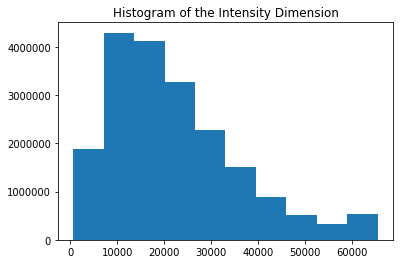

In [12]:
plt.hist(inFile.intensity)
plt.title("Histogram of the Intensity Dimension")
plt.show()

In [13]:
df = pd.DataFrame() 
df['X'] = inFile.X 
df['Y'] = inFile.Y 
df['Z'] = inFile.Z
df['class'] = inFile.classification
display(df)

,X,Y,Z,class
0,29803389,504137591,12154,5
1,29803194,504137331,10357,2
2,29803094,504137463,10335,2
3,29803411,504137126,11376,5
4,29803409,504137112,10350,2
...,...,...,...,...
19619095,29858561,504199963,6437,6
19619096,29858581,504199939,6438,6
19619097,29858603,504199914,6439,6
19619098,29858621,504199893,6440,6


In [14]:
df['class'].value_counts()

2    10110619
6     6100469
5     3408012
Name: class, dtype: int64

In [60]:
def check_if_nan_or_inf(df_sel):
    print("max: ", df_sel.max())
    print("min: ", df_sel.min())
    print("If nan exists? ", df_sel.isnull().values.any())
    print("If no inf exists? ", np.isfinite(df_sel).all())

In [61]:
check_if_nan_or_inf(df['X'])

max:  29900000
min:  29800000
If nan exists?  False
If no inf exists?  True


In [62]:
check_if_nan_or_inf(df['Y'])

max:  504200000
min:  504100000
If nan exists?  False
If no inf exists?  True


In [63]:
check_if_nan_or_inf(df['Z'])

max:  22628
min:  4391
If nan exists?  False
If no inf exists?  True


In [64]:
check_if_nan_or_inf(df['class'])

max:  6
min:  2
If nan exists?  False
If no inf exists?  True


## Plot the tile using datashader

In [15]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

With `datashader`, we can choose what we want to plot on the x and y axes (e.g. in line `agg = cvs.points(df, 'X', 'Y', ds.mean('Z'))`) and see the full data immediately, with no parameter tweaking, magic numbers, subsampling, or approximation, up to the resolution of the display:

In [65]:
np.warnings.filterwarnings('ignore')

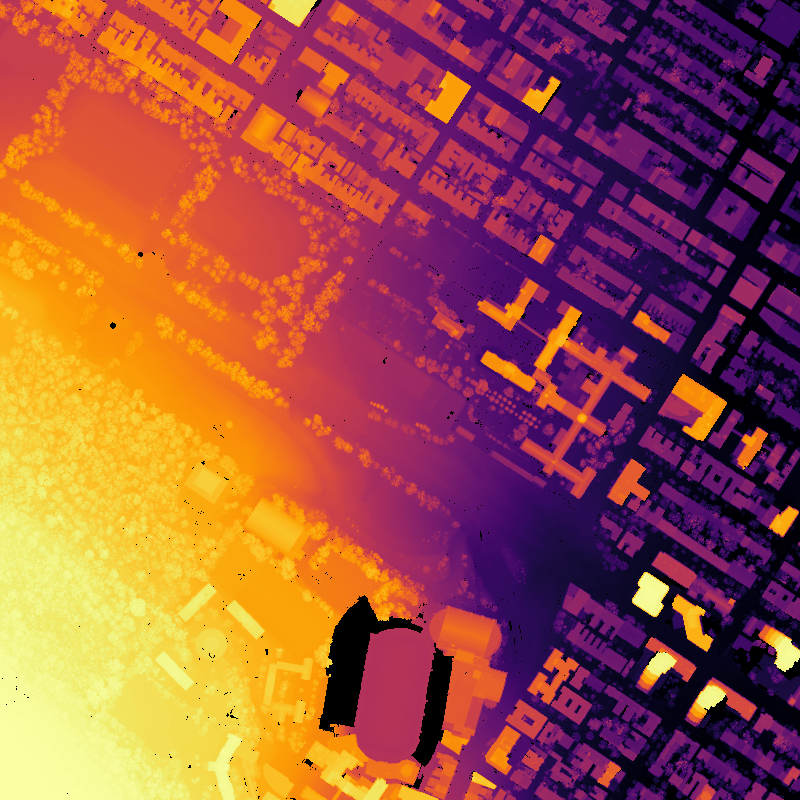

In [66]:
cvs = ds.Canvas(plot_width=800, plot_height=800)
agg = cvs.points(df, 'X', 'Y', ds.mean('Z'))
img = tf.shade(agg, cmap=['lightblue', 'darkblue'], how='log')
tf.set_background(tf.shade(agg, cmap=cm.inferno),"black")

Here you can immediately see that the data points being plotted, and that the quality of the signal varies spatially (with some areas having blurry patterns that indicate GPS errors, perhaps due to tall buildings). Getting a plot like this with other approaches would take quite a bit of time and effort, but with `datashader `it appears in milliseconds without trial and error.

The output above is just a bare image, which is all that datashader knows how to generate directly. But `datashader` can integrate closely with `Bokeh`, `HoloViews`<a href="#References">[4]</a>, and `GeoViews`, which makes it simple to allow interactive zooming, axis labeling, overlays and layouts, and complex web apps. For example, making a zoomable interactive overlay on a geographic map requires just a few more lines of code:

In [ ]:
!pip install holoviews

In [33]:
for name, ts in hv.element.tiles.tile_sources.items():
    print(name, ts())

CartoDark :Tiles   [x,y]
CartoEco :Tiles   [x,y]
CartoLight :Tiles   [x,y]
CartoMidnight :Tiles   [x,y]
StamenTerrain :Tiles   [x,y]
StamenTerrainRetina :Tiles   [x,y]
StamenWatercolor :Tiles   [x,y]
StamenToner :Tiles   [x,y]
StamenTonerBackground :Tiles   [x,y]
StamenLabels :Tiles   [x,y]
EsriImagery :Tiles   [x,y]
EsriNatGeo :Tiles   [x,y]
EsriUSATopo :Tiles   [x,y]
EsriTerrain :Tiles   [x,y]
EsriReference :Tiles   [x,y]
OSM :Tiles   [x,y]
Wikipedia :Tiles   [x,y]


For full documentation and the available style and plot options, use `hv.help(hv.Tiles)`.

In [ ]:
hv.help(hv.Tiles)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
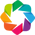

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [X,Y]   (R,G,B,A)

In [44]:
from colorcet import fire
import holoviews as hv
from holoviews.element import tiles
from holoviews.operation.datashader import datashade
hv.extension('bokeh')

url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'
tile_opts  = dict(width=800,height=800,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
map_tiles  = tiles.EsriImagery().opts(style=dict(alpha=0.5), plot=tile_opts)
points     = hv.Points(df, ['X', 'Y'])
lidar_pts = datashade(points, x_sampling=1, y_sampling=1, cmap=fire, width=800, height=800)

map_tiles * lidar_pts

You can select the `Wheel Zoom` tool on the right and then do panning and zooming (with the scroll bar). The maps will update as you zoom, but the datashaded image will only update if you have a live Python process running.

## Separate the different classes of pixel

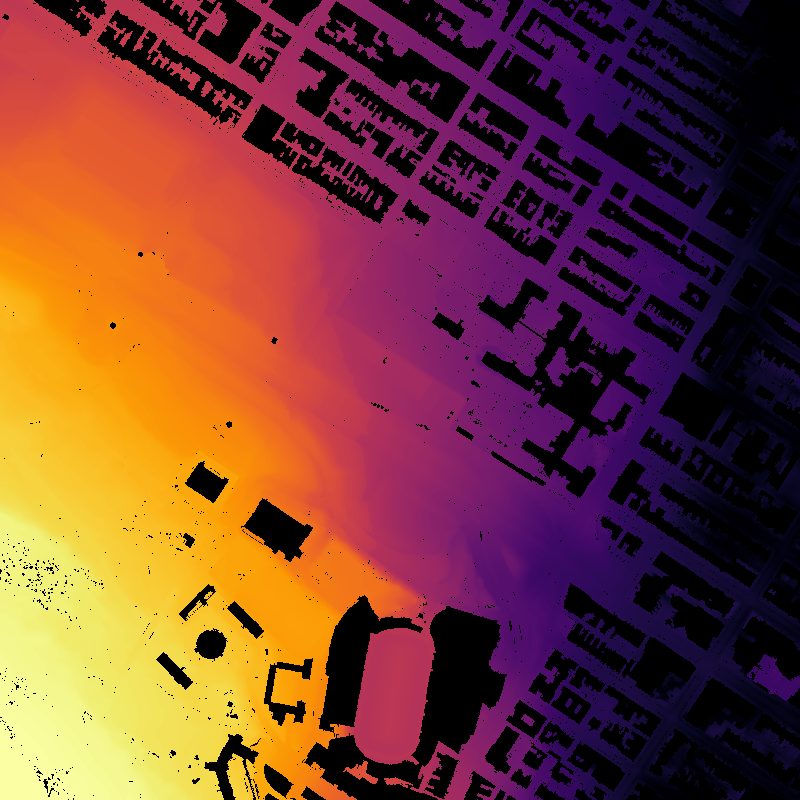

In [67]:
# Create a dataframe containing only the lidar voxels for one class
# 2=Ground, 5=High Veg, and 6=buildings.
class_df = df.loc[df['class'] == 2]

# Visualize with datashader
cvs = ds.Canvas(plot_width=800, plot_height=800)
agg = cvs.points(class_df, 'X', 'Y', ds.mean('Z'))
img = tf.shade(agg, how='log')
tf.set_background(tf.shade(agg, cmap=cm.inferno),"black")

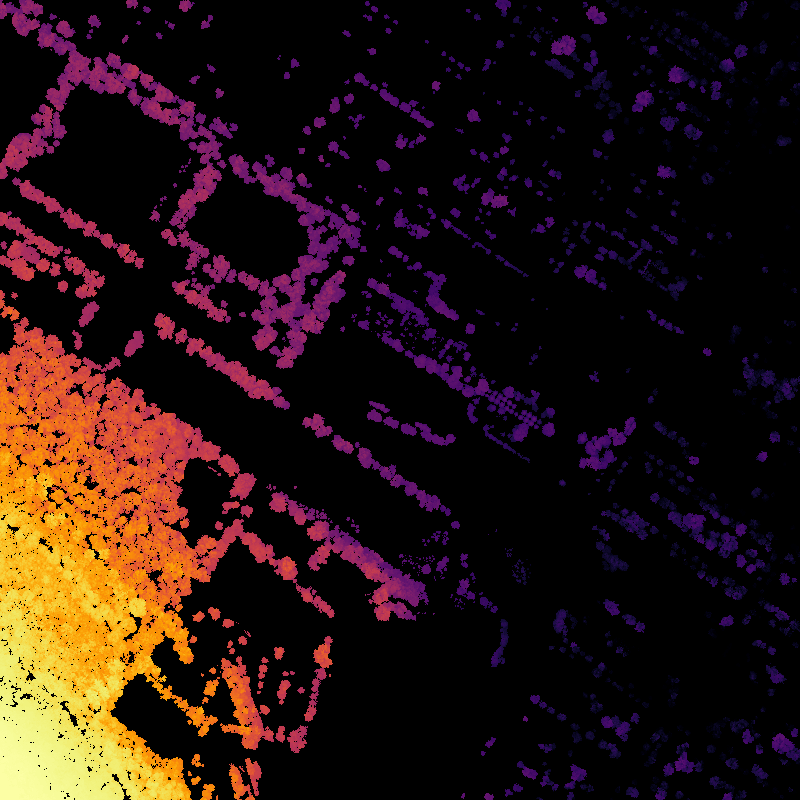

In [69]:
# Combine multiple classes of voxels that contain levels of vegetation
veg_df = df.loc[(df['class'] > 2) & (df['class'] < 6)]

# Visualize with datashader
cvs = ds.Canvas(plot_width=800, plot_height=800)
agg = cvs.points(veg_df, 'X', 'Y', ds.mean('Z'))
img = tf.shade(agg)#, how='log')
tf.set_background(tf.shade(agg, cmap=cm.inferno),"black")

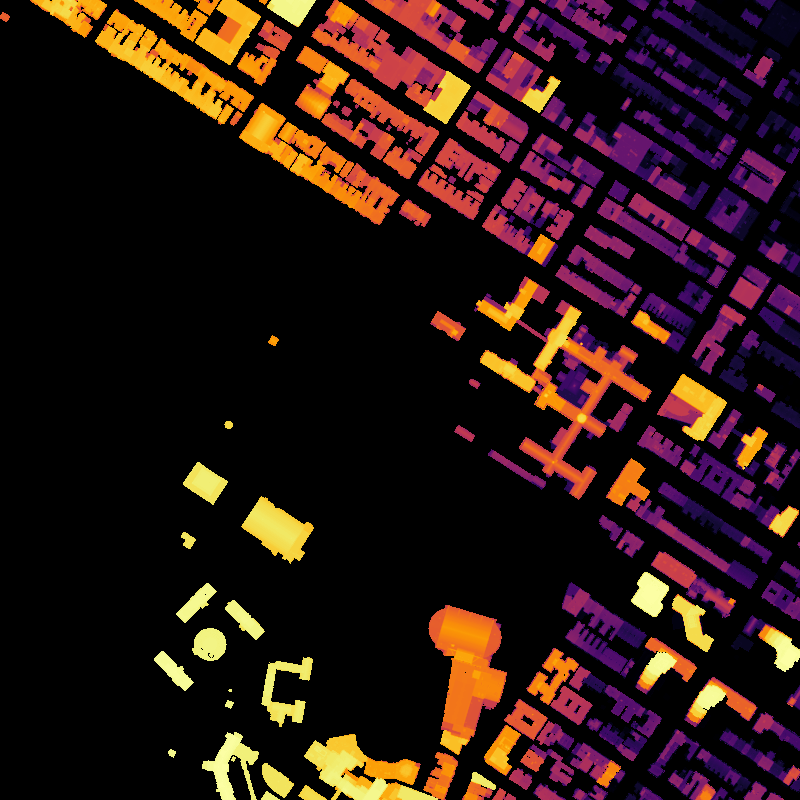

In [70]:
# Create a dataframe containing only the lidar voxels for 6=buildings.
class_df = df.loc[df['class'] == 6]

# Visualize with datashader
cvs = ds.Canvas(plot_width=800, plot_height=800)
agg = cvs.points(class_df, 'X', 'Y', ds.mean('Z'))
img = tf.shade(agg)#, how='log')
tf.set_background(tf.shade(agg, cmap=cm.inferno),"black")

## Create a 3D surface visualization


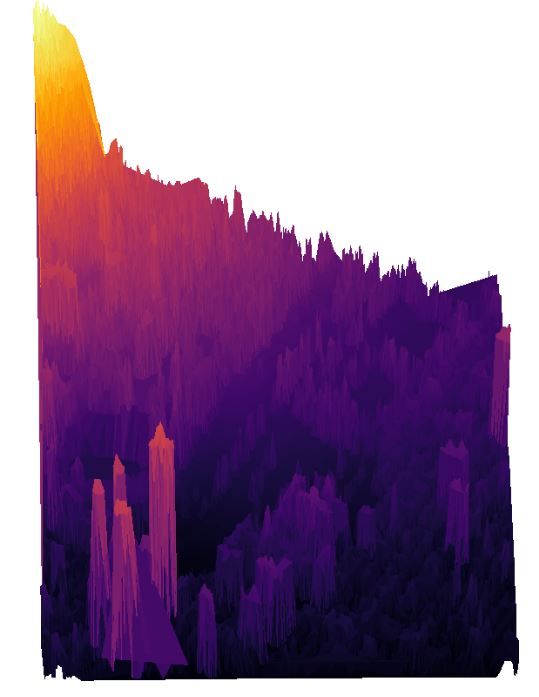

In [1]:
import os

# Use entire image containing olympic stadium, etc.
X = df['X']
Y = df['Y']
Z = df['Z']

# Downsample x and y
ds_factor = 500
ds_x = X[::ds_factor] 
ds_y = Y[::ds_factor] 
ds_z = Z[::ds_factor] 

##### Export the gif
frames = []
identifier = 'bigO_tile_downsample_' + str(ds_factor) + 'x_surface_lidar5'  

if not os.path.exists(export_path):
    os.makedirs(export_path)

fig = plt.figure(figsize = (20,20)) 
ax = fig.add_subplot(111, projection='3d')

# Plot the surface.
surf = ax.plot_trisurf(ds_x, ds_y, ds_z, cmap=cm.inferno,
                       linewidth=0, antialiased=False)

for angle in range(0, 360):
    ax.view_init(45, angle) # Higher angle than usually used of 30.
    ax.set_axis_off()

    # Draw the figure
    fig.canvas.draw()

    # Convert to numpy array, and append to list
    np_fig = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
    np_fig = np_fig.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    frames.append(np_fig)

In [72]:
import imageio
imageio.mimsave(export_path + identifier + '.gif', frames)

In [ ]:
from IPython.display import Image
with open(export_path + identifier + '.gif', 'rb') as file:
    display(Image(file.read()))

## References

[1] https://datashader.org/getting_started/Introduction.html

[2] https://quorumetrix.blogspot.com/2018/06/visualizing-lidar-data-with-datashader.html

[3] https://laspy.readthedocs.io/en/latest/tut_part_1.html

[4] https://holoviews.org/reference/elements/bokeh/Tiles.html#bokeh-gallery-tiles